Empezamos importando las librerias que vamos a necesitar. 
Tenemos a numpy, a matplotlib.pyplot que son las tradicionales. 
De matplotlib, importamos animation que es lo que nos va a servir para animar. 

Ademas, para poder ver las animaciones en colab, tenemos que importar algunas cosas mas (IPython.display y rc). 

Despues de eso, definimos dos funciones. Primero "modo_fijo" que calcula la posicion de N osciladores con extremos fijos en funcion del tiempo. Y despues tambien definimos la funcion "modo_mixto" que hace lo mismo pero para un extremo libre. 

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from matplotlib import rc
rc('animation', html='jshtml')

def modo_fijo(t, A, p, phi, w0, N):
    
    k = np.pi * p / ((N+1))
    w = 4 * w0**2 * np.sin(k/2)**2
    psies = []
    for n in range(1, N+1):
        psi_n = A * np.sin(n*k) * np.cos(w*t+phi)
        psies.append(psi_n)
        
    return psies


def modo_mixto(t, A, p, phi, w0, N):
    
    k = np.pi * p / (N+1/2)
    alpha = -np.pi*p/(2*N)
    w = 4 * w0**2 * np.sin(k/2)**2
    psies = []
    for n in range(1, N+1):
        psi_n = A * np.sin(n*k+alpha) * np.cos(w*t+phi)
        psies.append(psi_n)
        
    return psies

Bien ahora solo hay que decidir los parameteros que queremos (numero de osciladores N, frecuencia $\omega_0$, fase $\phi$, amplitud $A$ y el vector de tiempos para el cual queremos ver la dinámica. 

En este bloque ademas elegimos un solo modo $p$ para animarlo. Al correr este bloque, si bien se genera la animacion (que llamamos con la variable 'anim"), aun no la vamos a poder ver. Solo nos va a mostrar el instante inicial. 

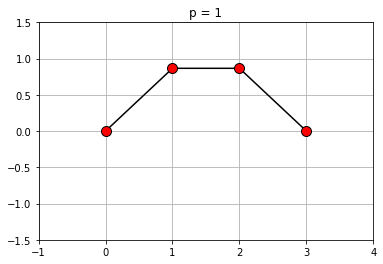

In [5]:
N = 2

phi = 0
w0 = 1
A = 1
t = np.linspace(0, 100, 1000)

p = 1
psies = modo_fijo(t, A, p, phi, w0, N)

fig= plt.figure(1)
plt.clf()
ax = plt.gca()

line, = ax.plot([], [], 'k-o', markerfacecolor = 'r', markersize = 10);
plt.grid();
plt.xlim(-1, N+2);
plt.ylim(-1.5, 1.5);
plt.title(f'p = {p}');
points = [np.array(psies)[:,i] for i in range(len(t))]
def drawframe(i):
    coords = np.concatenate([[0], points[i], [0]])
    line.set_data(np.arange(0, N+2), coords);
    return (line, )

anim = animation.FuncAnimation(fig, drawframe, frames = 200, interval =10, blit = True);

Ahora sí, para visualizar la animación, simplemente pedimos visualizar la variable "anim" para que se muestre. Este paso puede demorar unos segundos porque colab tiene que genererar la visalizacion en el explorador. 

In [7]:
anim

El siguiente bloque hace lo mismo pero muestra todos los modos. 

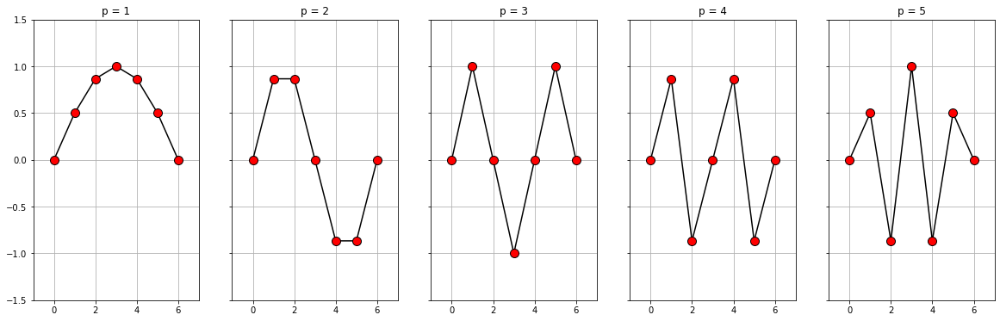

In [27]:
N = 5
phi = 0
w0 = 1
A = 1
t = np.linspace(0, 20, 100)



fig= plt.figure(1, figsize = (4*N, 6))
plt.clf()
fig, axs = plt.subplots(1, N, sharex = True, sharey = True, num = 1)

lines = []
for p, ax in enumerate(axs):
    line, = ax.plot([], [], 'k-o', markerfacecolor = 'r', markersize = 10)
    lines.append(line)
    ax.grid()
    ax.set_title(f'p = {p+1}')
    ax.set_xlim(-1, N+2)
    ax.set_ylim(-1.5, 1.5)
def drawframe(i):
    for p, line in enumerate(lines):
        p = p + 1
        psies = modo_fijo(t, A, p, phi, w0, N)
        points = [np.array(psies)[:,i] for i in range(len(t))]    
        coords = np.concatenate([[0], points[i], [0]])
        line.set_data(np.arange(0, N+2), coords)
    return lines

anim = animation.FuncAnimation(fig, drawframe, frames = 100, interval = 100, blit = True)

In [28]:
anim

Ahora hacemos lo mismo para el caso de extremos mixtos. Primero para un dado modo: 

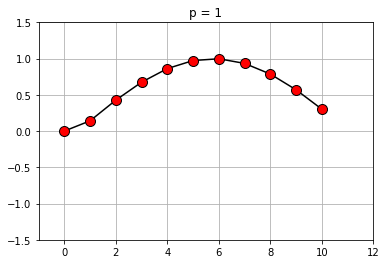

In [38]:
N = 10

phi = 0
w0 = 1
A = 1
t = np.linspace(0, 500, 1000)

p = 1
psies = modo_mixto(t, A, p, phi, w0, N)

fig= plt.figure(1)
plt.clf()
ax = plt.gca()

line, = ax.plot([], [], 'k-o', markerfacecolor = 'r', markersize = 10);
plt.grid();
plt.xlim(-1, N+2);
plt.ylim(-1.5, 1.5);
plt.title(f'p = {p}');
points = [np.array(psies)[:,i] for i in range(len(t))]
def drawframe(i):
    coords = np.concatenate([[0], points[i]])
    line.set_data(np.arange(0, N+1), coords);
    return (line, )

anim = animation.FuncAnimation(fig, drawframe, frames = 200, interval =10, blit = True);

In [39]:
anim

Y ahora para todos:

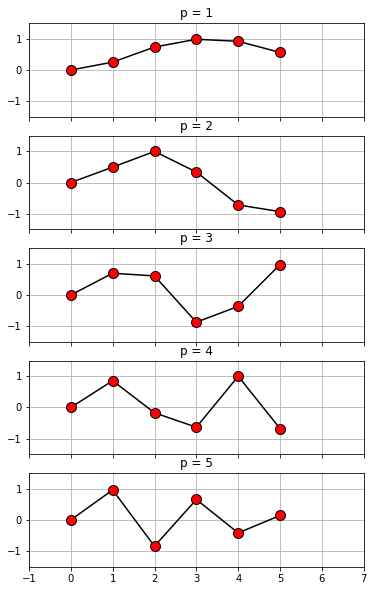

In [29]:
N = 5
phi = 0
w0 = 1
A = 1
t = np.linspace(0, 200, 1000)



fig= plt.figure(1, figsize = (6, 2*N))
plt.clf()
fig, axs = plt.subplots(N, 1, sharex = True, sharey = True, num = 1)

lines = []
for p, ax in enumerate(axs):
    line, = ax.plot([], [], 'k-o', markerfacecolor = 'r', markersize = 10)
    lines.append(line)
    ax.grid()
    ax.set_title(f'p = {p+1}')
    ax.set_xlim(-1, N+2)
    ax.set_ylim(-1.5, 1.5)
def drawframe(i):
    for p, line in enumerate(lines):
        p = p + 1
        psies = modo_mixto(t, A, p, phi, w0, N)
        points = [np.array(psies)[:,i] for i in range(len(t))]    
        coords = np.concatenate([[0], points[i]])
        line.set_data(np.arange(0, N+1), coords)
    return lines

anim = animation.FuncAnimation(fig, drawframe, frames = 100, interval = 50, blit = True)

In [30]:
anim